In [1]:
import pandas as pd
import scanpy as sc

import matplotlib as mpl
import matplotlib.pyplot as plt
from copy import copy

vir = copy(mpl.cm.viridis)
vir.set_under("lightgray")

In [2]:
adata = sc.read_h5ad('human_neocortex_raw.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 33986 × 35543
    obs: 'barcode'
    var: 'gene_short_name'

In [4]:
adata.layers['count'] = adata.X.copy()

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

adata.layers['plot'] = adata.X.copy()

In [5]:
sc.pp.scale(adata)

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/utils/extmath.py:337: RuntimeWarning: invalid value encountered in matmul
  Q, _ = normalizer(A @ Q)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: divide by zero encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/utils/extmath.py:338: RuntimeWarning: overflow encountered in matmul
  Q, _ = normalizer(A.T @ Q)
/Library/Frameworks/Python.framework/Versions/3.13/lib/pyth

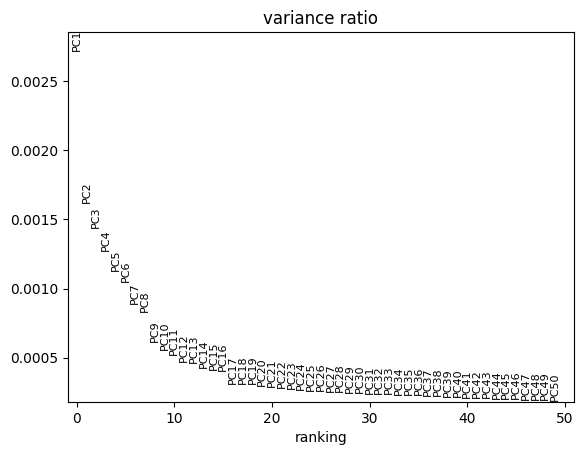

In [6]:
sc.tl.pca(adata,svd_solver = 'auto')
sc.pl.pca_variance_ratio(adata,n_pcs=50)

In [7]:
sc.pp.neighbors(adata,metric = 'sqeuclidean',n_pcs = 16,n_neighbors = 30)
sc.tl.umap(adata,min_dist = 0.3)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


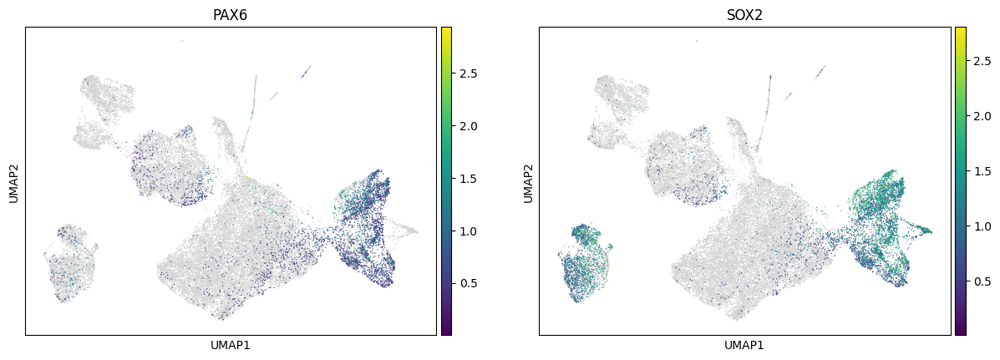

In [8]:
sc.pl.umap(adata,color = ['PAX6','SOX2'],layer = 'plot',color_map = vir,vmin = 0.0000001,
           gene_symbols = 'gene_short_name')

In [9]:
metadata = pd.read_csv('./sc_dev_cortex_geschwind/cell_metadata.csv')

In [10]:
ref = dict(zip(metadata['Cell'],metadata['Gestation_week']))
adata.obs['Gestation_week'] = adata.obs['barcode'].map(ref)

In [11]:
ref = dict(zip(metadata['Cell'],metadata['Cluster']))
adata.obs['annotated_cell'] = adata.obs['barcode'].map(ref)

In [12]:
adata[~adata.obs['annotated_cell'].isna(),:]

View of AnnData object with n_obs × n_vars = 33976 × 35543
    obs: 'barcode', 'Gestation_week', 'annotated_cell'
    var: 'gene_short_name', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'count', 'plot'
    obsp: 'distances', 'connectivities'

In [13]:
adata = adata[~adata.obs['annotated_cell'].isna(),:]

In [14]:
adata.obs['celltype'] = adata.obs['annotated_cell'].replace(['ExM', 'ExDp1', 'ExN', 
                                                             'ExM-U','ExDp2'],'EN')
adata.obs['celltype'].replace(['InCGE', 'Mic','InMGE','PgS','PgG2M','OPC','End','Per'],'Other',
                              inplace=True)


/var/folders/zn/t9jjvbrn56db3dmnfrqck3640000gn/T/ipykernel_16353/3842819135.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['celltype'] = adata.obs['annotated_cell'].replace(['ExM', 'ExDp1', 'ExN',
/var/folders/zn/t9jjvbrn56db3dmnfrqck3640000gn/T/ipykernel_16353/3842819135.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  adata.obs['celltype'].replace(['InCGE', 'Mic','InMGE','PgS','PgG2M','OPC','End','Per'],'Other',


In [15]:
adata.obs['celltype'].value_counts()

celltype
EN       23778
Other     5771
IP        2150
oRG       1293
vRG        984
Name: count, dtype: int64

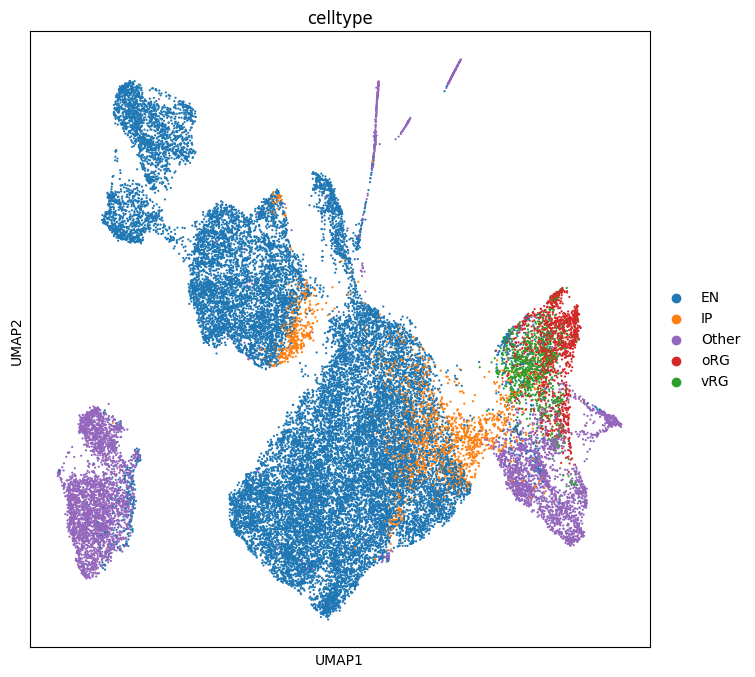

In [18]:
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(adata,color = 'celltype',size = 10,
               palette = ['#1f77b4','#ff7f0e','#9467bd','#d62728','#2ca02c'],
               save = 'Human_neocortex_celltype_v2.pdf'
               )

In [22]:
plt.rcParams['figure.dpi'] = 1500
fig, axs = plt.subplots(1, 2,figsize = (8,4))

sc.pl.dotplot(adata[(adata.obs['Gestation_week'] == 17.0) & (adata.obs['celltype']!='Other'),:],groupby = 'celltype',
              var_names = [x.upper() for x in ['Sox2','Pax6','Eomes',
                                                      'Neurod6','Pou3f2','Syngap1']],
                                                      gene_symbols = 'gene_short_name',
                                                      layer = 'plot',
                                                      show = False,
                                                      ax = axs[0],
                                                      dot_min = 0,
                                                      dot_max = 1,
                                                      #vmax = 1.1,
                                                      categories_order=['EN','IP','oRG','vRG'],
                                                      standard_scale = 'group'
                                                      )
axs[0].set_title('GW17')

sc.pl.dotplot(adata[(adata.obs['Gestation_week'] == 18.0) & (adata.obs['celltype']!='Other'),:] ,groupby = 'celltype',
              var_names = [x.upper() for x in ['Sox2','Pax6','Eomes',
                                                      'Neurod6','Pou3f2','Syngap1']],
                                                      gene_symbols = 'gene_short_name',
                                                      layer = 'plot',
                                                      show = False,
                                                      ax = axs[1],
                                                      dot_min = 0,
                                                      dot_max = 1,
                                                      #vmax = 1.1,
                                                      categories_order=['EN','IP','oRG','vRG'],
                                                      standard_scale = 'group'
                                                      )
axs[1].set_title('GW18')

Text(0.5, 1.0, 'GW18')

In [23]:
sc.pl.umap(adata,color = ['SYNGAP1'],layer = 'plot',color_map = vir,vmin = 0.0000001,
           gene_symbols = 'gene_short_name')

In [24]:
sc.pl.umap(adata,color = ['POU3F2'],layer = 'plot',color_map = vir,vmin = 0.0000001,
           gene_symbols = 'gene_short_name')